In [ ]:
!pip install --quiet bertopic datasets datamapplot
!pip install -qU langchain-google-genai

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.7/143.7 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 145.1/145.1 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 53.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 12.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 48.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 4.3 MB/s eta 0:00:00
ERRO

In [ ]:
import os
from google.colab import userdata
os.environ["GOOGLE_API_KEY"] = userdata.get('GOOGLE_API_KEY')


SecretNotFoundError: Secret GOOGLE_API_KEY does not exist.

In [ ]:
from langchain_google_genai import ChatGoogleGenerativeAI
llm = ChatGoogleGenerativeAI(
    model="gemini-1.5-pro",
    temperature=0,
    max_tokens=None,
    timeout=None,
    max_retries=2,
    # other params...
)



In [ ]:
from datasets import load_dataset
dataset = load_dataset("maartengr/arxiv_nlp")["train"]

# extract metadata
abstracts = dataset["Abstracts"]
titles = dataset["Titles"]


/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/617 [00:00<?, ?B/s]

data.csv:   0%|          | 0.00/53.2M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

In [ ]:
print(abstracts[100])
print("--"*20)
print(titles[100])


  Formal work in linguistics has both produced and used important mathematical
tools. Motivated by a survey of models for context and word meaning, syntactic
categories, phrase structure rules and trees, an attempt is being made in the
present paper to present a mathematical model for structuring of sentences from
active voice to passive voice, which is is the form of a transitive verb whose
grammatical subject serves as the patient, receiving the action of the verb.
  For this purpose we have parsed all sentences of a corpus and have generated
Boolean groups for each of them. It has been observed that when we take
constituents of the sentences as subgroups, the sequences of phrases form
permutation roups. Application of isomorphism property yields permutation
mapping between the important subgroups. It has resulted in a model for
transformation of sentences from active voice to passive voice. A computer
program has been written to enable the software developers to evolve grammar
softw

**INTERVIEW QUESTION : WHAT IS THE EMBEDDING MODEL YOU ARE USING . <br> AND WHY THAT MODEL ONLY .**

In [ ]:
# i am using this model becuase
# my target converting the abstract into vector along iwth capturing meaning
# i have many models for that as embedding model already pretrained to convert into vetors with meaning
# so i will choose a light weight model

# generally how you choose the embedding model is you see the leader board
# GO TO mteb/leaderboard in the hugging face
# so go to it and choose it .



In [ ]:
!pip install transformers


**EMBEDDING MODELS ARE GENERATED WITH 3 steps : <br>
1) install sentence-transformers<br>
2) from sentence_transformes import SentenceTransformer <br>
3) model = SentenceTransformer(Model name) <br>
**

In [ ]:
!pip install --quiet sentence-transformers

**Model here i am using is gte-small
 in hugging face .model and its parameters is 33.4 million so its very small  **

In [ ]:
from sentence_transformers import SentenceTransformer
# create an embedding for each abstract

embedding_model = SentenceTransformer("thenlper/gte-small")
embeddings = embedding_model.encode(abstracts , show_progress_bar = True )


The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

modules.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/68.1k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/57.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/583 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/66.7M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/394 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

In [ ]:
result = embedding_model.encode("hello_world")
print(result.shape)

(384,)


In [ ]:
print(embeddings.shape)

(44949, 384)


NO for dimensitionaly reduction we are using the UMAP (Uniform Manifold Approximation and Projection)

In [ ]:
!pip install --quiet umap-learn


In [ ]:
from umap import UMAP
umap_model = UMAP(
    n_components = 5 , min_dist = 0.0 , metric = 'cosine'
)
reduced_embeddings = umap_model.fit_transform(embeddings)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
# just this is for example : we are making it in 2dim space
umap_model_checking = UMAP(
    n_components = 2 , min_dist = 0.0 , metric = 'cosine'
)
checking = umap_model_checking.fit_transform(embeddings)


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
print(reduced_embeddings.shape)

(44949, 5)


In [ ]:
print(checking.shape)

(44949, 2)


** Now lets cluster the data and based on the cluster we will topic model it **

** WHy clusterring :
saay you have given the query .<br>
now you know first we will convert the query into the embeddings <br>
Now we know we have to extract the most similar abstract/doc. <br>
We cann not go to every document and check the similarity score . so what we will do is topic modeling or clusterring <br>
what happens is we will firstcheck the embedding belongs to which cluster so that we will eleminate all the other clusters . so now see whats happening . our query range is decreased . <br>
in this cluster we will check and return the max similarity scored abstract**

In [ ]:
!pip install hdbscan

In [ ]:
from hdbscan import HDBSCAN

hdbscan_model = HDBSCAN(
    min_cluster_size = 50 ,
    metric = 'euclidean',
    cluster_selection_method = 'eom'
).fit(reduced_embeddings)
clusters = hdbscan_model.labels_
len(set(clusters))


/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


161

In [ ]:
# this is for just checking not any other thing
hdbscan_model_checking = HDBSCAN(
    min_cluster_size = 50 ,
    metric = 'euclidean',
    cluster_selection_method = 'eom'
).fit(checking)
clusters_checking = hdbscan_model.labels_
len(set(clusters_checking))

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


161

NOW LETS INSPECT THE CLUSTERS .
lets see the any three absratcs that belongs to cluster 0 .

In [ ]:
import numpy as np
cluster = 0
for index in np.where(clusters == cluster )[0][:3]:
  print(abstracts[index][:300] + "....." + ".. \n")


  This works aims to design a statistical machine translation from English text
to American Sign Language (ASL). The system is based on Moses tool with some
modifications and the results are synthesized through a 3D avatar for
interpretation. First, we translate the input text to gloss, a written fo....... 

  Researches on signed languages still strongly dissociate lin- guistic issues
related on phonological and phonetic aspects, and gesture studies for
recognition and synthesis purposes. This paper focuses on the imbrication of
motion and meaning for the analysis, synthesis and evaluation of sign lang....... 

  Modern computational linguistic software cannot produce important aspects of
sign language translation. Using some researches we deduce that the majority of
automatic sign language translation systems ignore many aspects when they
generate animation; therefore the interpretation lost the truth inf....... 



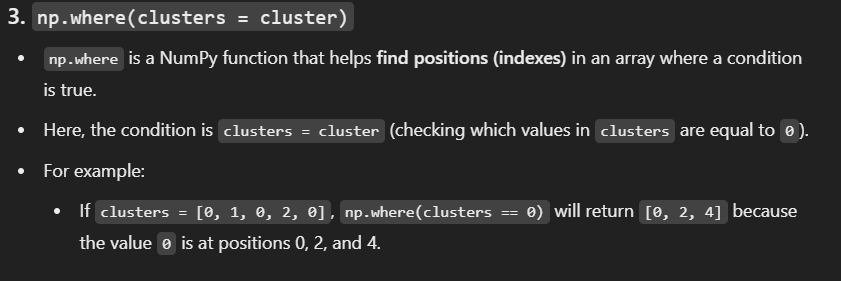

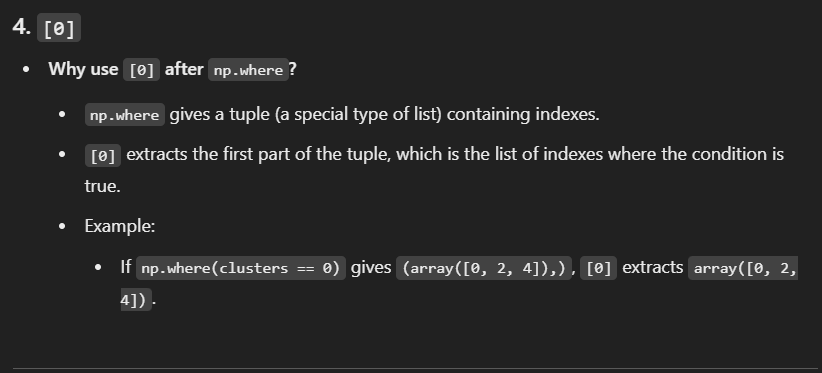

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

df = pd.DataFrame(checking , columns = ["x" , "y"])
df["title"] = titles
df["cluster"] = [str(c) for c in clusters]

clusters_df = df.loc[df.cluster != "-1" , :]
outliers_df = df.loc[df.cluster == "=1" , :]


(-8.187125277519225,
 11.294976782798766,
 -5.373309183120727,
 10.421169328689576)

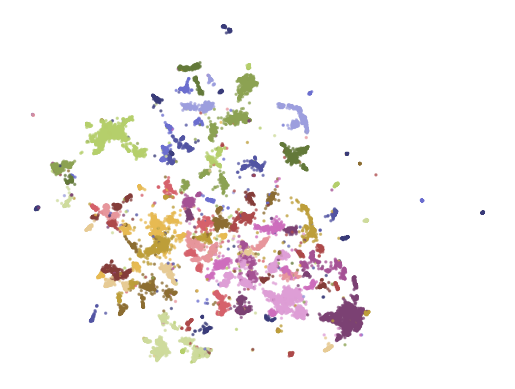

In [ ]:
import matplotlib.pyplot as plt

plt.scatter(outliers_df.x , outliers_df.y , alpha = 0.05 , s = 2 , c = "grey" )
plt.scatter(
    clusters_df.x , clusters_df.y , c = clusters_df.cluster.astype(int) , alpha = 0.6 , s = 2 , cmap = 'tab20b'
)

plt.axis('off')

In [ ]:
# Install BERTopic and its dependencies
!pip install bertopic


In [ ]:
from sentence_transformers import SentenceTransformer
# create an embedding for each abstract

embedding_model = SentenceTransformer("thenlper/gte-small")
embeddings = embedding_model.encode(abstracts , show_progress_bar = True )
from umap import UMAP
umap_model = UMAP(
    n_components = 5 , min_dist = 0.0 , metric = 'cosine'
)
reduced_embeddings = umap_model.fit_transform(embeddings)
from hdbscan import HDBSCAN
hdbscan_model = HDBSCAN(
    min_cluster_size = 50 ,
    metric = 'euclidean',
    cluster_selection_method = 'eom'
).fit(reduced_embeddings)

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

modules.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/68.1k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/57.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/583 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/66.7M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/394 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


2025-01-16 08:33:50,230 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-01-16 08:34:57,992 - BERTopic - Dimensionality - Completed ✓
2025-01-16 08:34:57,996 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-01-16 08:35:00,821 - BERTopic - Cluster - Completed ✓
2025-01-16 08:35:00,847 - BERTopic - Representation - Extracting topics from clusters using representation models.
2025-01-16 08:35:05,571 - BERTopic - Representation - Completed ✓


In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,14956,-1_the_of_and_to,"[the, of, and, to, in, we, language, for, that...",[ The impressive progress in NLP techniques h...
1,0,2056,0_question_qa_answer_questions,"[question, qa, answer, questions, answering, a...",[ A key challenge of multi-hop question answe...
2,1,1801,1_speech_asr_recognition_acoustic,"[speech, asr, recognition, acoustic, end, spea...",[ This paper presents a method to train end-t...
3,2,1023,2_translation_nmt_machine_bleu,"[translation, nmt, machine, bleu, neural, engl...","[ This paper describes the acquisition, prepr..."
4,3,896,3_summarization_summaries_summary_abstractive,"[summarization, summaries, summary, abstractiv...",[ Abstractive summarization has made tremendo...
...,...,...,...,...,...
155,154,52,154_coherence_discourse_paragraph_cohesion,"[coherence, discourse, paragraph, cohesion, te...",[ While there has been significant progress t...
156,155,52,155_sentence_embeddings_sts_similarity,"[sentence, embeddings, sts, similarity, embedd...",[ There have been many successful application...
157,156,50,156_counseling_mental_therapy_health,"[counseling, mental, therapy, health, psychoth...",[ Mental health care poses an increasingly se...
158,157,50,157_arabic_sentiment_analysis_dialect,"[arabic, sentiment, analysis, dialect, msa, re...","[ Social media such as Twitter, Facebook, etc..."


In [ ]:
topic_model.get_topic(11)

[('legal', 0.0765139392496965),
 ('court', 0.01590263867069464),
 ('law', 0.015070785085153342),
 ('case', 0.013789084558091047),
 ('documents', 0.009280578983113888),
 ('judgment', 0.009156464635339149),
 ('cases', 0.008507714923453069),
 ('domain', 0.008379178798800487),
 ('ljp', 0.007721614239875378),
 ('of', 0.006632444854268504)]

In [ ]:
topic_model.find_topics("topic modelling")
# find topics will tell topics related to these query

([27, -1, 47, 33, 89],
 [0.94768786, 0.9071661, 0.90488756, 0.8995344, 0.8981757])

In [ ]:
topic_model.get_topic(26)

[('simplification', 0.05408948766974142),
 ('readability', 0.02323414373893833),
 ('complexity', 0.014594526072726408),
 ('lexical', 0.01251357763344316),
 ('sentence', 0.01195937025485549),
 ('ts', 0.011883082681605869),
 ('text', 0.01177516858489323),
 ('simplified', 0.00995916070327673),
 ('complex', 0.009383534045938407),
 ('sentences', 0.008913051701830644)]

now lets vizualize hte topics

In [ ]:
fig = topic_model.visualize_documents(
    titles ,
    reduced_embeddings = reduced_embeddings ,
    width = 1200 ,
    hide_annotations = True
)
fig.update_layout(font = dict(size = 16 ))

In [ ]:
topic_model.visualize_barchart()


In [ ]:
topic_model.visualize_hierarchy()


In [ ]:
topic_model.visualize_heatmap(n_clusters = 30 )


THE FINAL VERSION OF TEXT MODELLING

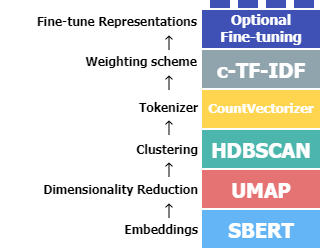

In [ ]:
!pip install datasets transformers sentence-transformers hdbscan umap bertopic

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 75.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.7/143.7 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 143.5/143.5 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.8/88.8 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.8/194.8 kB 19.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 6.5 MB/s eta 0:00:00
  Created wheel for umap: filename=umap-0.1.1-py3-none-any.whl size=3542 sha256=75c852cd8cab8dada50f69eba749432050c985641a5d787ebd489c372ca5223d
  Stored in directory: /root/.cache/pip/wheels/82/d8/73/e9eb3334baaad795ff0278363ff1aca7568bdf27

In [ ]:
# 1 dataset downloading
from datasets import load_dataset

data = load_dataset('maartengr/arxiv_nlp')["train"]

abstracts = data["Abstracts"]
titles = data["Titles"]

print(f" title : {titles[0]} \n  abstract : {abstracts[0]}")

 title : Introduction to Arabic Speech Recognition Using CMUSphinx System 
  abstract :   In this paper Arabic was investigated from the speech recognition problem
point of view. We propose a novel approach to build an Arabic Automated Speech
Recognition System (ASR). This system is based on the open source CMU Sphinx-4,
from the Carnegie Mellon University. CMU Sphinx is a large-vocabulary;
speaker-independent, continuous speech recognition system based on discrete
Hidden Markov Models (HMMs). We build a model using utilities from the
OpenSource CMU Sphinx. We will demonstrate the possible adaptability of this
system to Arabic voice recognition.



In [ ]:
# embeding generation :
from sentence_transformers import SentenceTransformer
embedding_model = SentenceTransformer('thenlper/gte-small')
embeddings = embedding_model.encode(abstracts , show_progress_bar = True)


modules.json:   0%|          | 0.00/385 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/68.1k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/57.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/583 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/66.7M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/394 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/712k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

1_Pooling/config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1405 [00:00<?, ?it/s]

In [ ]:
print(embeddings.shape)

(44949, 384)


In [ ]:
# dimensionality redectuion
from umap import UMAP
umap_model = UMAP(
    n_components = 5 , min_dist = 0.0 , metric = 'cosine'
)
reduced_embeddings = umap_model.fit_transform(embeddings)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
# now clustering
from hdbscan import HDBSCAN
hdbscan_model = HDBSCAN(
    min_cluster_size = 50 , metric= 'euclidean' , cluster_selection_method = 'eom'
).fit(reduced_embeddings)

/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


In [ ]:
# namins the custer usinf the tfidef which is done by bertopic .
# it is modular so we make all the module combine .

In [ ]:
from bertopic import BERTopic

topic_model = BERTopic(
    embedding_model = embedding_model ,
    umap_model = umap_model ,
    hdbscan_model = hdbscan_model ,
    verbose = True
).fit(abstracts , embeddings)

2025-01-16 18:57:28,953 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
2025-01-16 18:58:31,116 - BERTopic - Dimensionality - Completed ✓
2025-01-16 18:58:31,119 - BERTopic - Cluster - Start clustering the reduced embeddings
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be

** topic modelling is like out of the box it has the dteails of names it has the hierarchy structure and many functions . we can serach in it and do many things **

In [ ]:
topic_model.get_topic_info()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,13951,-1_the_of_and_to,"[the, of, and, to, in, we, language, that, for...",[ Pre-training and fine-tuning have achieved ...
1,0,2196,0_question_qa_answer_questions,"[question, qa, answer, questions, answering, a...",[ Question Answering (QA) is one of the most ...
2,1,2013,1_speech_asr_recognition_end,"[speech, asr, recognition, end, acoustic, spea...",[ This paper presents a method to train end-t...
3,2,1331,2_medical_clinical_biomedical_patient,"[medical, clinical, biomedical, patient, notes...",[ Pre-training large-scale neural language mo...
4,3,1264,3_summarization_summaries_summary_abstractive,"[summarization, summaries, summary, abstractiv...",[ Pre-trained neural abstractive summarizatio...
...,...,...,...,...,...
149,148,54,148_counseling_mental_health_therapy,"[counseling, mental, health, therapy, psychoth...",[ Mental health care poses an increasingly se...
150,149,54,149_emotion_ser_recognition_speech,"[emotion, ser, recognition, speech, iemocap, a...",[ Acoustic emotion recognition aims to catego...
151,150,53,150_diffusion_generation_autoregressive_text,"[diffusion, generation, autoregressive, text, ...",[ Diffusion models have achieved great succes...
152,151,52,151_similarity_sts_semantic_distance,"[similarity, sts, semantic, distance, wmd, bet...","[ Semantic textual similarity (STS), a corner..."


'24_generation_text_control_decoding'

In [ ]:
print(type(topic_model.get_topic_info()))

<class 'pandas.core.frame.DataFrame'>


In [ ]:
# name is like top 4 tfidf words in the cluster and combing them together : hurray name is formed


In [ ]:
# see this how we find the relavent documents for the query
topic_model.find_topics("diffusion")

([150, 18, 44, 28, -1],
 [0.88572794, 0.8437017, 0.835426, 0.82947433, 0.8291303])

In [ ]:
# now lets see the 150  cluster name and some abstracts in it
topic_model.get_topic(150)

[('diffusion', 0.12772529784947925),
 ('generation', 0.020343971638765206),
 ('autoregressive', 0.018511187620199526),
 ('text', 0.016423911457849966),
 ('models', 0.014337314608836065),
 ('continuous', 0.014281297833531669),
 ('discrete', 0.013107804123403654),
 ('image', 0.012882348742033017),
 ('images', 0.010686265549885159),
 ('prompts', 0.01051568317929435)]

In [ ]:
topic_model.get_topic_info()["Name"][151]

'150_diffusion_generation_autoregressive_text'

In [ ]:
for abstract in topic_model.get_topic_info()["Representative_Docs"][151]:
  print(f"these are the relavent abstracts for the search query : {abstract} \n")
  print("----"*50)

these are the relavent abstracts for the search query :   Diffusion models have achieved great success in modeling continuous data
modalities such as images, audio, and video, but have seen limited use in
discrete domains such as language. Recent attempts to adapt diffusion to
language have presented diffusion as an alternative to existing pretrained
language models. We view diffusion and existing language models as
complementary. We demonstrate that encoder-decoder language models can be
utilized to efficiently learn high-quality language autoencoders. We then
demonstrate that continuous diffusion models can be learned in the latent space
of the language autoencoder, enabling us to sample continuous latent
representations that can be decoded into natural language with the pretrained
decoder. We validate the effectiveness of our approach for unconditional,
class-conditional, and sequence-to-sequence language generation. We demonstrate
across multiple diverse data sets that our latent l

In [ ]:
fig = topic_model.visualize_documents(
    titles ,
    reduced_embeddings = reduced_embeddings ,
    width = 1200 ,
    hide_annotations = True
)
fig.update_layout(font = dict(size = 16 ))

In [ ]:
# this is the search vizualization
topic_model.visualize_hierarchy()

In [ ]:
from copy import deepcopy
orginal_topics = deepcopy(topic_model.topic_representations_)

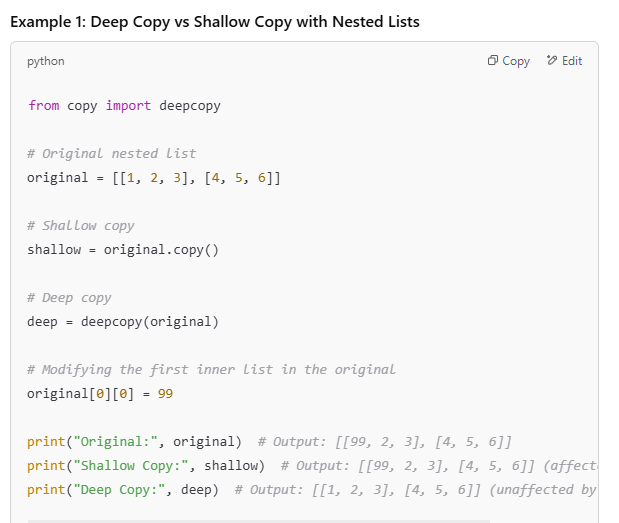

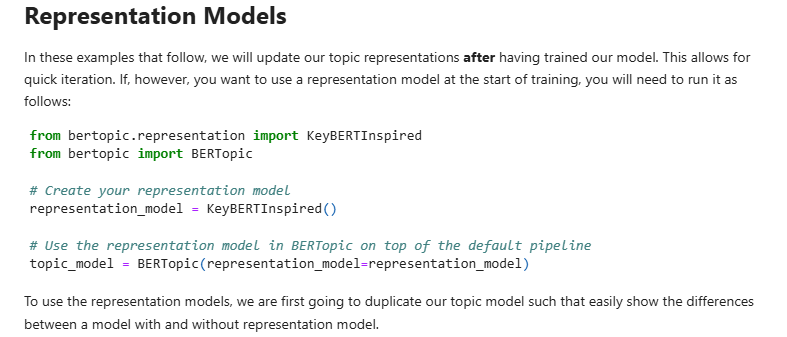

In [ ]:
import pandas as pd
def topic_differences(model, original_topics, nr_topics=5):
    """Show the differences in topic representations between two models """
    df = pd.DataFrame(columns=["Topic", "Original", "Updated"])
    for topic in range(nr_topics):

        # Extract top 5 words per topic per model
        og_words = " | ".join(list(zip(*original_topics[topic]))[0][:5])
        new_words = " | ".join(list(zip(*model.get_topic(topic)))[0][:5])
        df.loc[len(df)] = [topic, og_words, new_words]

    return df

**how hey breart insired is working is explained in the noted . <br>
**

In [ ]:
# here key bert or any other is for reanking
# the tfidf words and based on the context ie based on the embeddings of the sentences in the cluster

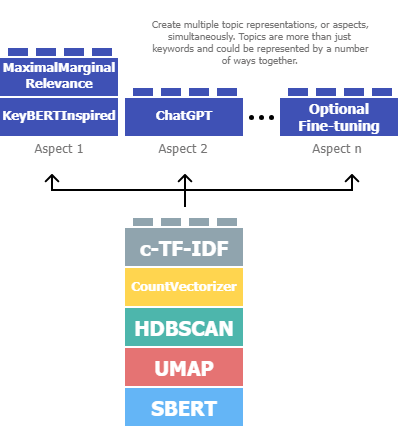

In [ ]:
from bertopic.representation import KeyBERTInspired

# Update our topic representations using KeyBERTInspired
representation_model = KeyBERTInspired()
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, orginal_topics)

,Topic,Original,Updated
0,0,question | qa | answer | questions | answering,answering | questions | retrieval | comprehens...
1,1,speech | asr | recognition | end | acoustic,speech | phonetic | language | transcription |...
2,2,medical | clinical | biomedical | patient | notes,nlp | clinical | ehr | biomedical | text
3,3,summarization | summaries | summary | abstract...,summarization | summarizing | summarisation | ...
4,4,translation | nmt | machine | bleu | neural,translation | translations | translate | trans...


MAXIMAL MARGINAL RELEVANCE IS LIKE HOW WE ARE REMOVING THE REDUNTANT TERMS . EX : LANGUAGE , LANGUAGES and segment , segmentation , segmenting like these we want to remove

In [ ]:
from bertopic.representation import MaximalMarginalRelevance

# Update our topic representations to MaximalMarginalRelevance
representation_model = MaximalMarginalRelevance(diversity=0.5)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, orginal_topics)

,Topic,Original,Updated
0,0,question | qa | answer | questions | answering,questions | retrieval | comprehension | knowle...
1,1,speech | asr | recognition | end | acoustic,speech | asr | error | model | automatic
2,2,medical | clinical | biomedical | patient | notes,clinical | biomedical | patient | extraction |...
3,3,summarization | summaries | summary | abstract...,summarization | document | extractive | rouge ...
4,4,translation | nmt | machine | bleu | neural,translation | nmt | bleu | neural | parallel


Now we saw clusterring happened and we named the clusters based on the semantic meaning . and we also have the fecility to search the cluster and document based on the query .

Now lets add the genrative model on top of it t et the relavent results .

In [ ]:
from transformers import pipeline
from bertopic.representation import TextGeneration


In [ ]:
prompt = """I have a topic that contains the following documents:
[DOCUMENTS]

The topic is described by the following keywords: '[KEYWORDS]'.

Based on the documents and keywords, what is this topic about?"""

# Update our topic representations using Flan-T5
generator = pipeline('text2text-generation', model='google/flan-t5-small')
representation_model = TextGeneration(
    generator, prompt=prompt, doc_length=50, tokenizer="whitespace"
)
topic_model.update_topics(abstracts, representation_model=representation_model)

# Show topic differences
topic_differences(topic_model, original_topics)

In [ ]:
fig = topic_model.visualize_document_datamap(
    titles,
    topics=list(range(20)),
    reduced_embeddings=reduced_embeddings,
    width=1200,
    label_font_size=11,
    label_wrap_width=20,
    use_medoids=True,
)
plt.savefig("datamapplot.png", dpi=300)